In [3]:
import pandas as pd
import numpy as np
import math as ma
import matplotlib.pyplot as plt

from pybrain.structure import FeedForwardNetwork
from pybrain.structure import LinearLayer, TanhLayer, FullConnection
from pybrain.supervised.trainers import BackpropTrainer
from pybrain.datasets import SupervisedDataSet
from pybrain.tools.customxml.networkwriter import NetworkWriter
from pybrain.tools.customxml.networkreader import NetworkReader
from pybrain.tools.shortcuts import buildNetwork
from pybrain.utilities import percentError
from sklearn import preprocessing

from sklearn.preprocessing import normalize

min_max_scaler = preprocessing.MinMaxScaler()

In [4]:
Cpro=pd.read_csv("Cpro.csv")
Cval=pd.read_csv("Cval.csv")
Ctra=pd.read_csv("Ctra.csv")
Cmom=pd.read_csv("Cmom.csv")
Cfd=pd.read_csv("Cfd.csv")
Ctec=pd.read_csv("Ctec.csv")

In [15]:
def fnn3(frame,string):
    df=frame.dropna(axis=0,how='any')
    name=string
    nm1=name+"tst2.png"
    nm2=name+"cov2.png"
    x=df.drop(columns=['code','date','price'])
    x=np.array(x)
    x=normalize(x, axis=0, norm='max')
    y=np.array(df['ret'])
    x=np.delete(x,1,axis=1)
    xdim=x.shape[1]
    ydim=1
    DS=SupervisedDataSet(xdim,ydim)
    
    for i in range(len(x)):
        DS.addSample(x[i],y[i])
    
    dataTrain, dataTest = DS.splitWithProportion(0.8)
    dataPlot, datadrop =DS.splitWithProportion(0.08)
    xTrain, yTrain = dataTrain['input'],dataTrain['target']
    xTest, yTest = dataTest['input'], dataTest['target']
    xPlot, yPlot= dataPlot['input'], dataPlot['target']
    fnn=buildNetwork(xdim,xdim+1,xdim+2,int(0.5*(xdim+1)),ydim,hiddenclass=TanhLayer,outclass=LinearLayer)
    trainer=BackpropTrainer(fnn,dataTrain,learningrate=0.0001,verbose=True)
    err_train, err_valid =trainer.trainUntilConvergence(maxEpochs=100)
    
    predict_resutl=[]
    for i in np.arange(len(xPlot)):
        predict_resutl.append(fnn.activate(xPlot[i])[0])
    print(predict_resutl)
    
    tstresult = percentError( trainer.testOnClassData(), dataTest['target'] )
    print("epoch: %4d" % trainer.totalepochs, " test error: %5.2f%%" % tstresult)
    
   #yTest2=yTest([0:len(yTest):12])
   #pred2=predict_resutl([0:len(predict_resutl):12])
    
    plt.figure(figsize=(30,6), dpi=600)
    plt.xlabel("Test Timeline")
    plt.ylabel("Result")
    plt.plot(np.arange(0,len(xPlot)), yPlot,'ko-', label='true number')
    plt.plot(np.arange(0,len(xPlot)), predict_resutl,'ro--', label='predict number')
    lgnd1=plt.legend()
    plt.savefig(nm1,dpi=600, bbox_extra_artists=(lgnd1))
    
    plt.figure(figsize=(9,9), dpi=600)
    plt.plot(err_train,'b',label='train_err')
    plt.plot(err_valid,'r',label='valid_err')
    lgnd2=plt.legend()
    plt.xlabel("Training Times")
    plt.ylabel("Total Error")
    plt.savefig(nm2,dpi=600, bbox_extra_artists=(lgnd2))
    plt.show()
    
    return

Total error:  0.0360887475285
Total error:  0.0281975351352
Total error:  0.0235887544339
Total error:  0.020041632771
Total error:  0.0172884639324
Total error:  0.0151153246351
Total error:  0.0133847966379
Total error:  0.0119935627477
Total error:  0.0108558036315
Total error:  0.00991607229228
Total error:  0.00913236162672
Total error:  0.00847233501614
Total error:  0.0079118366969
Total error:  0.00743182816237
Total error:  0.00701834617393
Total error:  0.00665591723808
Total error:  0.00633977342963
Total error:  0.00606003301052
Total error:  0.00581252551445
Total error:  0.00559134854025
Total error:  0.00539280885809
Total error:  0.00521335490487
Total error:  0.00505061996964
Total error:  0.00490437490133
Total error:  0.00477078121872
Total error:  0.0046476055829
Total error:  0.00453481058875
Total error:  0.00443284418182
Total error:  0.00433839515465
Total error:  0.0042503390798
Total error:  0.00416841555074
Total error:  0.00409415106792
Total error:  0.00402

epoch:  101  test error:  0.02%


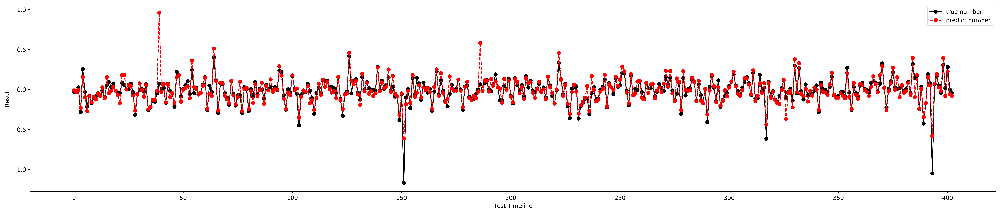

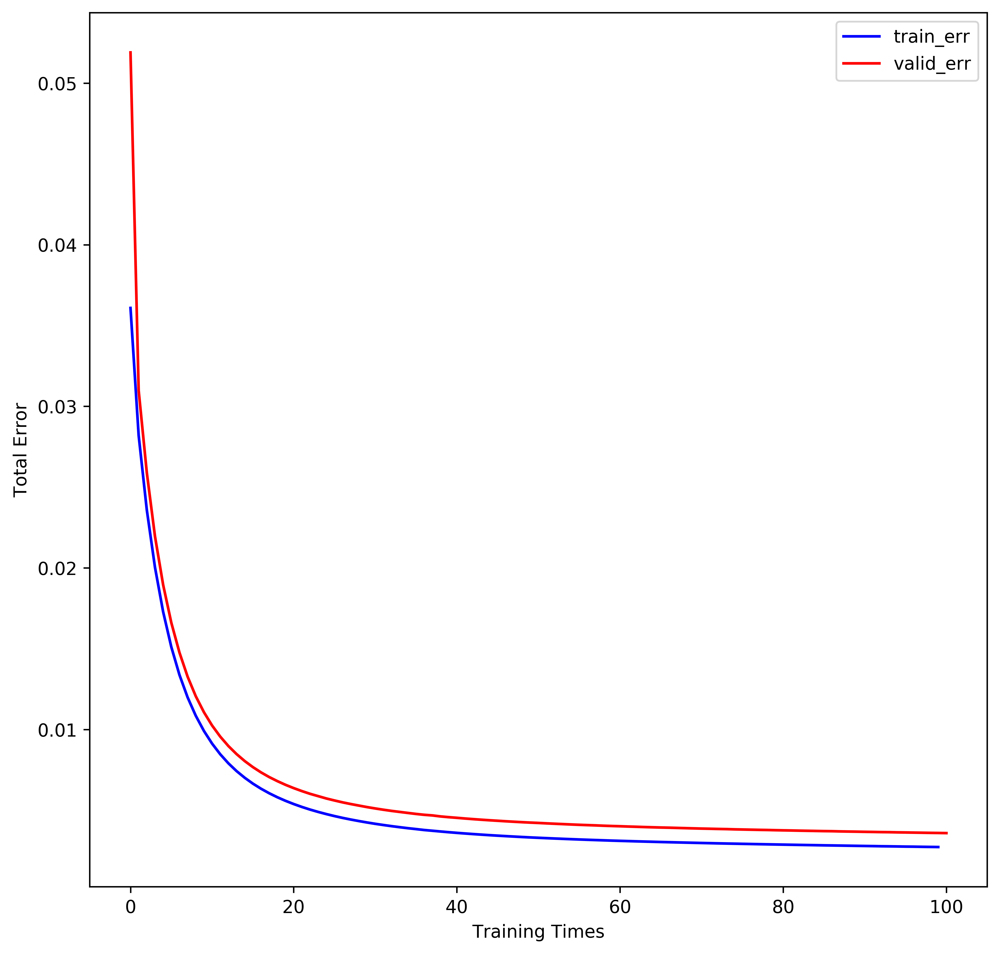

In [16]:
fnn3(Cpro,"Cpro")

Total error:  0.0760588773201
Total error:  0.0150338555814
Total error:  0.0140142848528
Total error:  0.0133832720338
Total error:  0.0128141529314
Total error:  0.0122979084058
Total error:  0.0118275076599
Total error:  0.0113951626561
Total error:  0.0109977277639
Total error:  0.0106292444656
Total error:  0.010286594938
Total error:  0.00996896772115
Total error:  0.00967201217329
Total error:  0.00939383927175
Total error:  0.00913029863069
Total error:  0.00887960562961
Total error:  0.00865278131718
Total error:  0.00843068182949
Total error:  0.00822119502142
Total error:  0.00802094456925
Total error:  0.0078314392713
Total error:  0.00765159015051
Total error:  0.00747872359733
Total error:  0.00731261743541
Total error:  0.00715554503117
Total error:  0.00700307895499
Total error:  0.00685780834594
Total error:  0.00671827685444
Total error:  0.00658292398113
Total error:  0.00645401721645
Total error:  0.00632870134082
Total error:  0.00620787634093
Total error:  0.00609

epoch:  101  test error:  0.03%


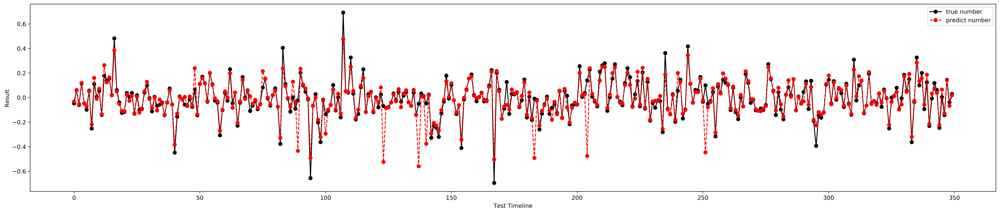

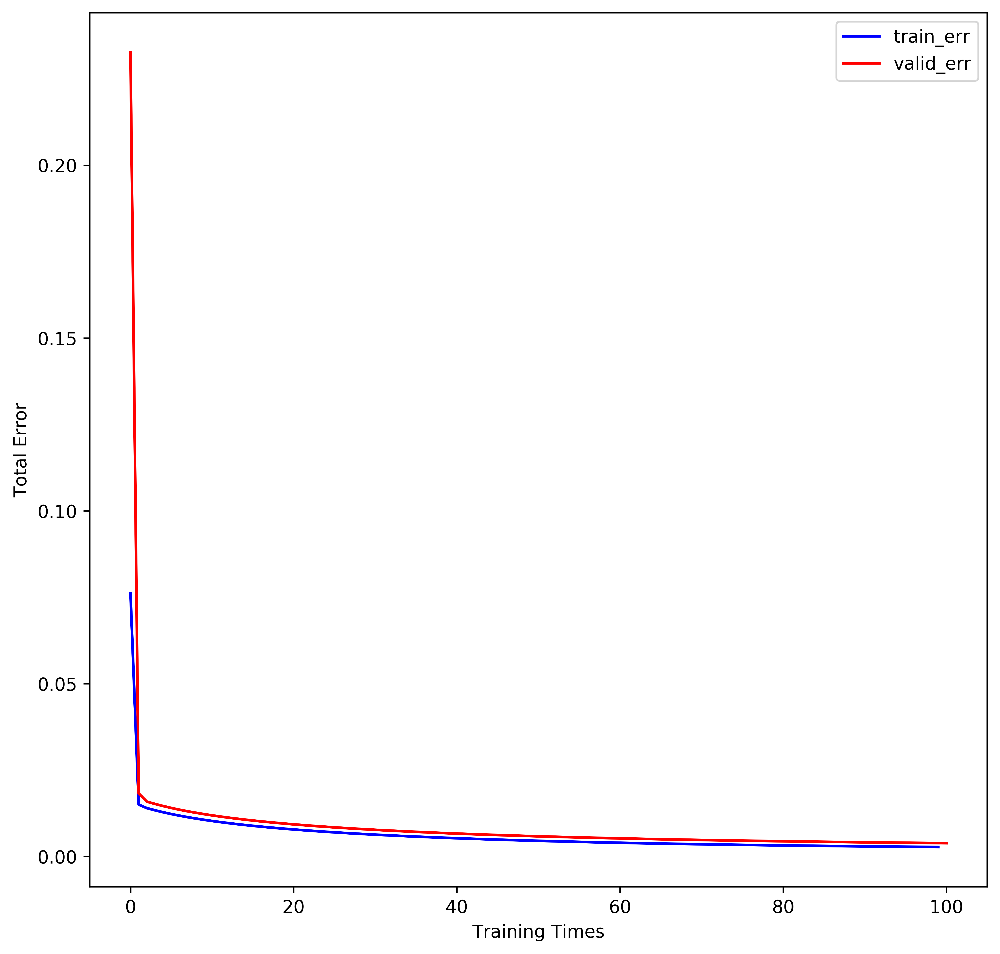

In [17]:
fnn3(Cval,"Cval")

Total error:  0.0205841298441
Total error:  0.00752204316362
Total error:  0.00678796417667
Total error:  0.00601454579779
Total error:  0.00533702225956
Total error:  0.00483036331149
Total error:  0.00448195377363
Total error:  0.00424433839631
Total error:  0.00407606401567
Total error:  0.00394757088708
Total error:  0.00384047779547
Total error:  0.00374559452231
Total error:  0.00365773232838
Total error:  0.00357305094665
Total error:  0.00349063439548
Total error:  0.00340948731759
Total error:  0.00332856804975
Total error:  0.00325029897586
Total error:  0.00317188221236
Total error:  0.00309357150621
Total error:  0.00301787987527
Total error:  0.00294190195419
Total error:  0.0028667162891
Total error:  0.00279289168866
Total error:  0.00272028329633
Total error:  0.002648924421
Total error:  0.00257863386558
Total error:  0.00250879202829
Total error:  0.00244192697055
Total error:  0.00237598354307
Total error:  0.00231098302769
Total error:  0.0022483816781
Total error: 

[0.07222374293027561, 0.13416798639069827, -0.08439593627330666, 0.05129939103411624, 0.11966409155436586, -0.08122902617798933, 0.0578632140910168, -0.32358163473578627, 0.051680216505238685, -0.2488941120064732, 0.294211613003338, 0.02781939033059358, 0.06620001131358166, 0.046247689435860106, -0.4169655628969223, -0.08474838450645056, -0.10309328788422278, -0.03287074379809571, 0.06842543737146367, -0.040447108550604516, -0.017871394013358327, -0.05624662307049813, 0.010734172993111718, -0.06347548791533075, 0.01626606176442824, 0.0174585842730704, -0.0312907592928757, 0.10665085544741837, -0.04046199767735181, -0.03978194992975645, -0.6179476215287335, -0.1446832710804209, -0.1435813129088413, -0.02569005488281831, 0.04598463161115318, 0.01417286560715425, 0.21840194683778502, 0.12558085143061598, -0.07634417364431256, -0.09860289612842077, 0.034623682489758834, 0.05401745163732374, 0.17889026301135957, -0.09336560434611108, 0.03601223031251932, -0.03272402617905651, -0.12220399102

epoch:  101  test error:  0.00%


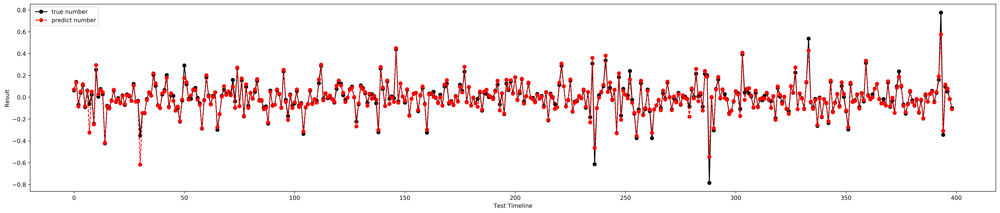

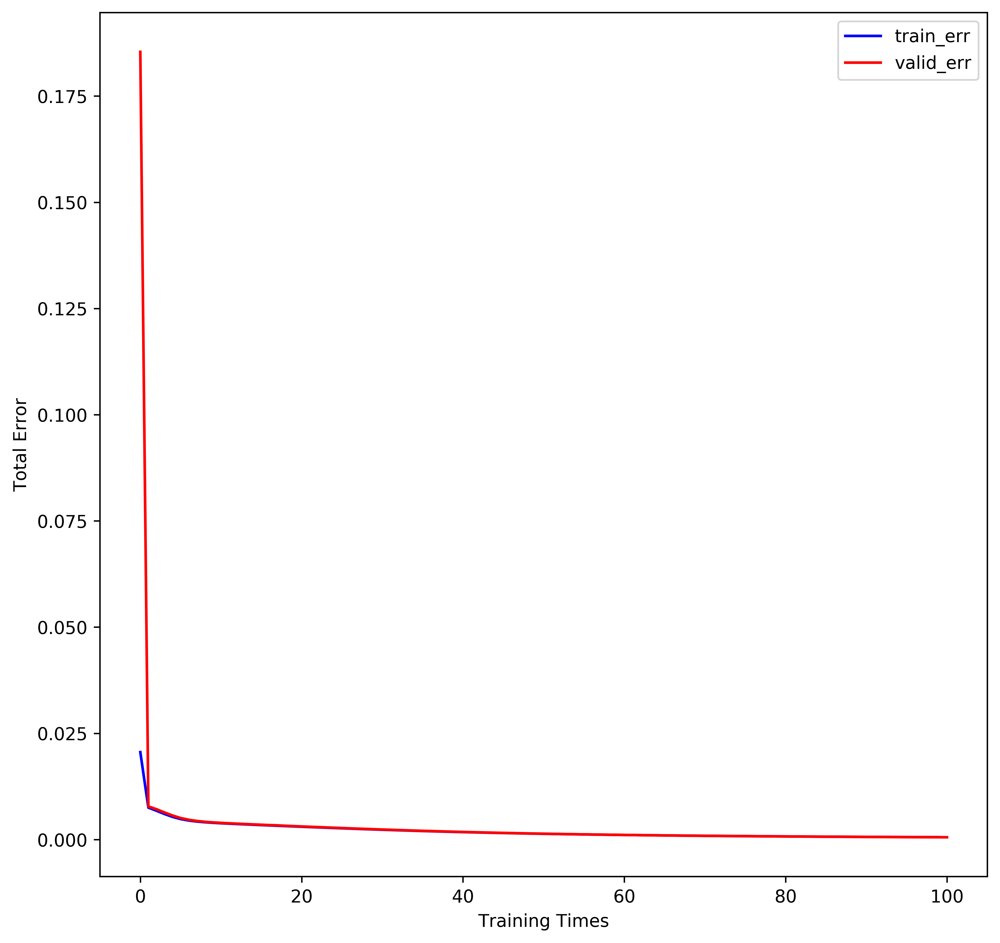

In [12]:
fnn3(Cmom,"Cmom")

Total error:  0.0245191934152
Total error:  0.0125520725903
Total error:  0.0115583039782
Total error:  0.0111336075459
Total error:  0.0109058334553
Total error:  0.0107640351513
Total error:  0.0106659549898
Total error:  0.0105916291998
Total error:  0.0105332734263
Total error:  0.0104852275741
Total error:  0.0104441152049
Total error:  0.0104065849881
Total error:  0.0103718592479
Total error:  0.0103361451844
Total error:  0.0103045449636
Total error:  0.0102700519251
Total error:  0.0102321827688
Total error:  0.0101951778664
Total error:  0.0101498929685
Total error:  0.0100992945865
Total error:  0.0100377258396
Total error:  0.00996234362937
Total error:  0.00986394033871
Total error:  0.00973454870843
Total error:  0.00955277172519
Total error:  0.00928422159692
Total error:  0.00886985069727
Total error:  0.00820002388166
Total error:  0.00711383550562
Total error:  0.00562127701556
Total error:  0.00436651114047
Total error:  0.00378745009085
Total error:  0.0035687252897

epoch:  101  test error:  0.00%


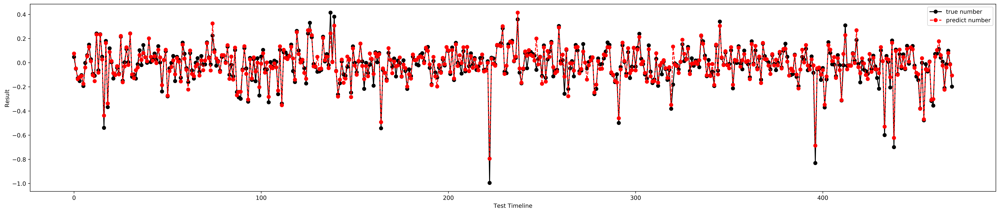

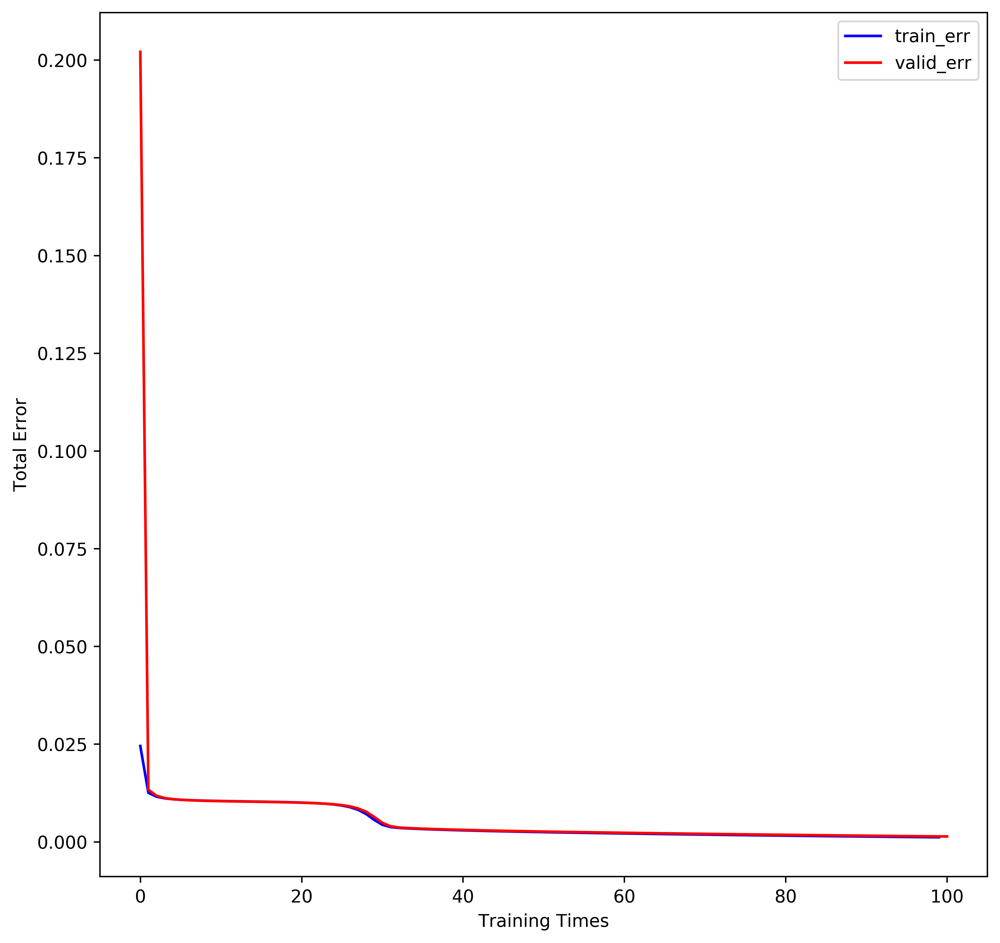

In [9]:
fnn3(Ctra,"Ctra")

Total error:  0.0298816641945
Total error:  0.0285295752272
Total error:  0.0273532504369
Total error:  0.0262694413716
Total error:  0.0252773220613
Total error:  0.0243662262675
Total error:  0.0235243845625
Total error:  0.0227487154034
Total error:  0.022031849221
Total error:  0.0213927102994
Total error:  0.0207954177065
Total error:  0.0202524612527
Total error:  0.0197523556698
Total error:  0.0193015302051
Total error:  0.0188886813143
Total error:  0.0185119594007
Total error:  0.0181701150188
Total error:  0.0178581878397
Total error:  0.0175751749474
Total error:  0.017317506998
Total error:  0.017082360531
Total error:  0.0168678487479
Total error:  0.0166720472252
Total error:  0.0164918508055
Total error:  0.0163273205215
Total error:  0.0161748156505
Total error:  0.0160318276388
Total error:  0.0159057871934
Total error:  0.0157842742466
Total error:  0.0156712907382
Total error:  0.0155650721641
Total error:  0.0154655519159
Total error:  0.0153705636086
Total error: 

epoch:  101  test error:  0.05%


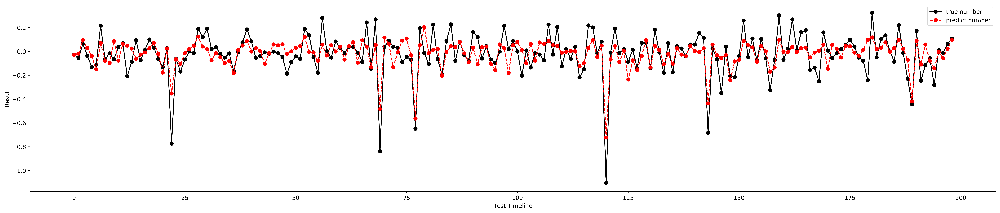

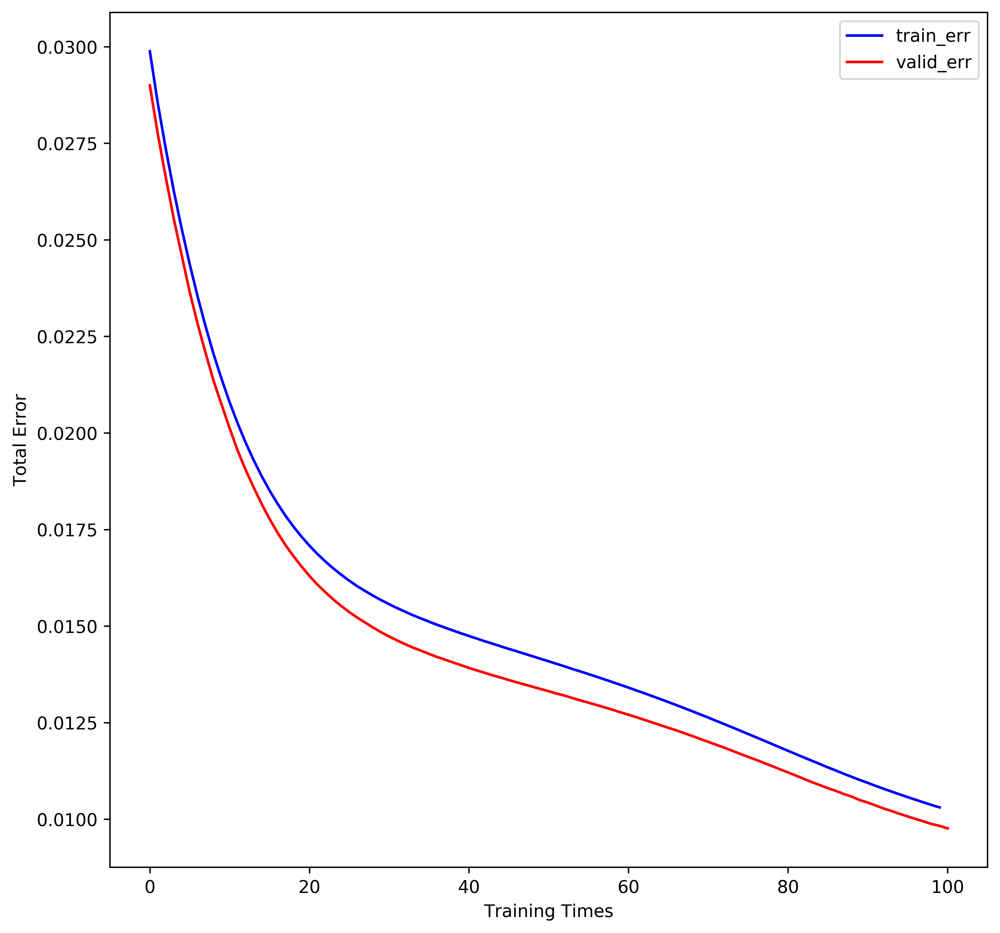

In [18]:
fnn3(Cfd,"Cfd")

Total error:  0.0581584747829
Total error:  0.0186786712659
Total error:  0.0151650281109
Total error:  0.0135046314979
Total error:  0.0124222795007
Total error:  0.0115895841192
Total error:  0.0108758523979
Total error:  0.0102083476722
Total error:  0.00955472641928
Total error:  0.00888759323949
Total error:  0.00821044932947
Total error:  0.00754543805833
Total error:  0.00692696525021
Total error:  0.00638213713834
Total error:  0.00592372108591
Total error:  0.00554503049672
Total error:  0.00523326475254
Total error:  0.00497576217164
Total error:  0.00475692971422
Total error:  0.00456785984125
Total error:  0.00440098491678
Total error:  0.00425056224685
Total error:  0.00411329885386
Total error:  0.00398692979216
Total error:  0.00386876577816
Total error:  0.00375843500999
Total error:  0.00365324086746
Total error:  0.00355422263058
Total error:  0.00346033139132
Total error:  0.00336964476416
Total error:  0.00328364147355
Total error:  0.00320110966892
Total error:  0.

epoch:  101  test error:  0.00%


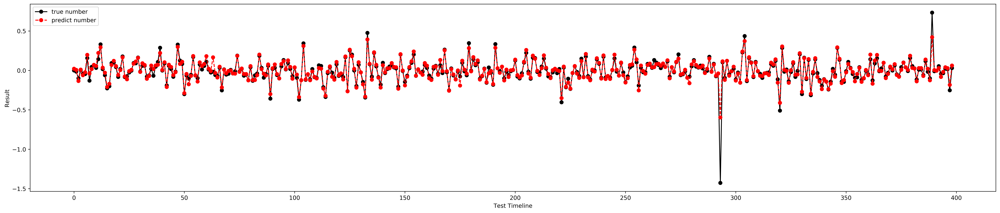

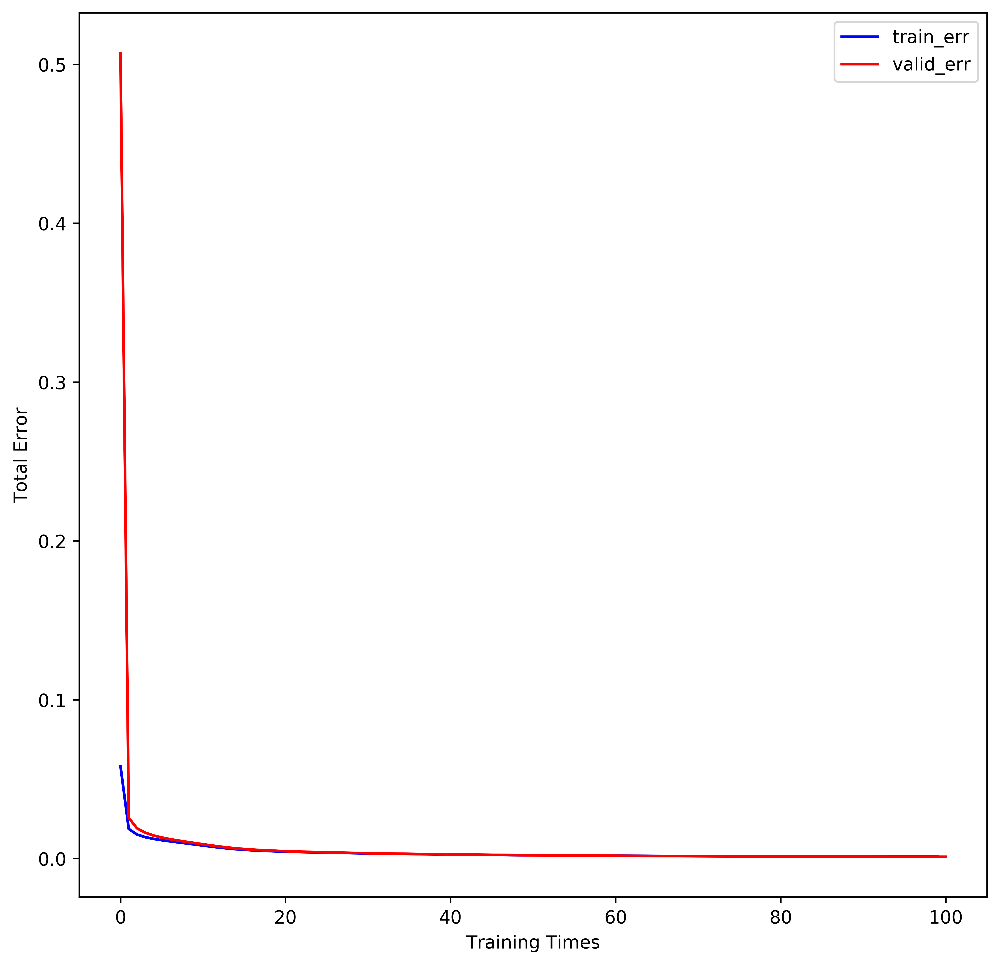

In [11]:
fnn3(Ctec,"Ctec")